Import

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import os
import json
import re
import cv2
import json
from pprint import pprint
import random

Helper Functions

In [14]:
def extract_id(file_name: str) -> str | None:
    """
    Give a file name such as 'A_P000001_PAS_CPG.tif',
    Extract the file ID: 'A_P000001' using regular expression
    """
    match = re.match(r"([A-Z]_P\d+)_", file_name, re.IGNORECASE)

    if match:
        return match.group(1)
    else:
        return None


def cell_mask_to_rgb(cell_mask: np.ndarray) -> np.ndarray:
    """For visualization purposes
    Convert 2D cell mask to an RGB image
    2D cell mask:
    1 - Lympchoyte centroids
    2 - Monocytes centroids
    RGB image:
    Green - Lympchoyte centroids
    Blue - Monocytes centroids
    """
    kernel = np.ones((5, 5), np.uint8)
    cell_mask = cv2.dilate(cell_mask, kernel, iterations=1)
    rgb_mask = np.zeros((cell_mask.shape[0], cell_mask.shape[1], 3), dtype=np.uint8)
    rgb_mask[cell_mask == 1] = (0, 255, 0)
    rgb_mask[cell_mask == 2] = (0, 0, 255)
    return rgb_mask

Visualize 50 random patches

'D_P000017_26208_16800_26464_17056.npy'
{'lymphocytes': [], 'monocytes': []}


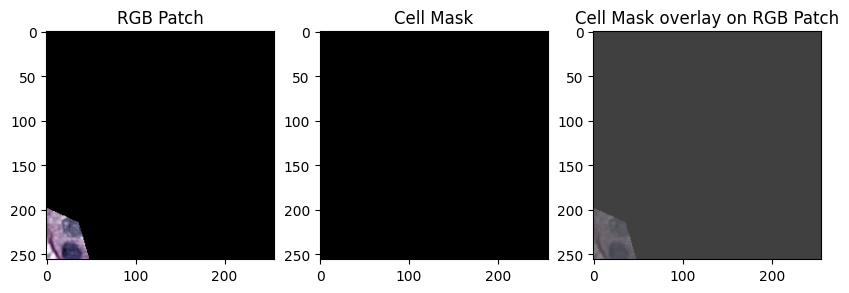

'A_P000038_53088_128128_53344_128384.npy'
{'lymphocytes': [[108, 166],
                 [136, 187],
                 [98, 208],
                 [128, 210],
                 [38, 234],
                 [104, 248],
                 [164, 137],
                 [14, 103]],
 'monocytes': [[142, 234], [78, 173], [41, 114], [140, 142]]}


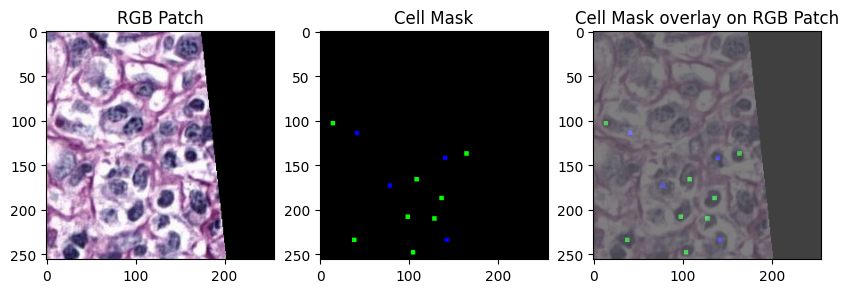

'C_P000029_28896_77952_29152_78208.npy'
{'lymphocytes': [], 'monocytes': [[14, 154]]}


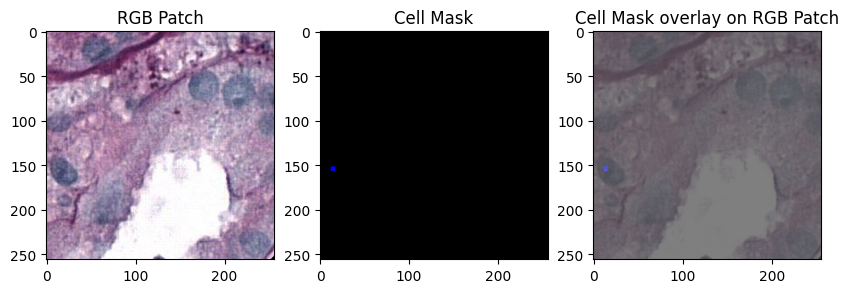

'D_P000001_26432_13440_26688_13696.npy'
{'lymphocytes': [[254, 50],
                 [20, 132],
                 [30, 190],
                 [0, 113],
                 [18, 217],
                 [61, 216],
                 [7, 228],
                 [102, 245],
                 [80, 6],
                 [116, 62],
                 [151, 95],
                 [108, 90],
                 [14, 90],
                 [255, 136]],
 'monocytes': [[112, 155], [112, 198], [209, 239], [198, 75]]}


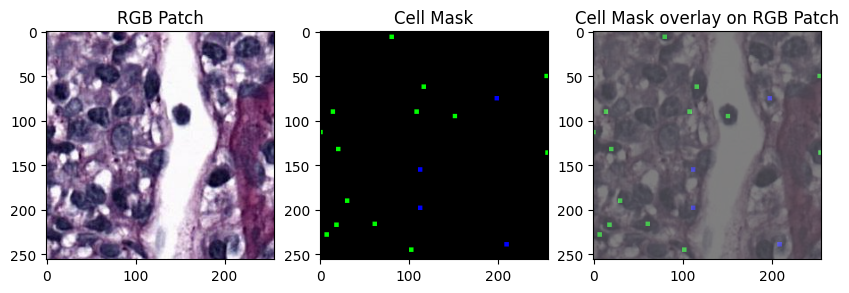

'D_P000012_10304_33824_10560_34080.npy'
{'lymphocytes': [], 'monocytes': [[222, 40]]}


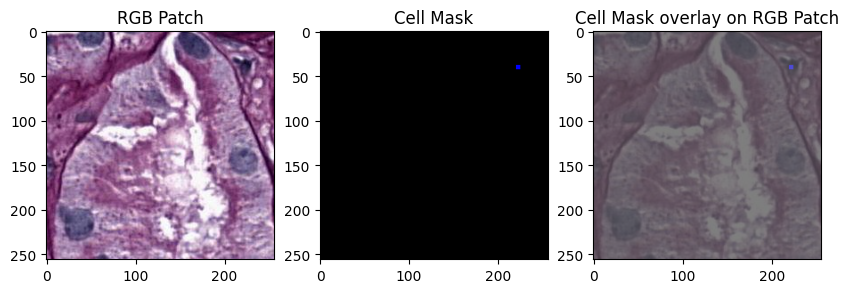

'D_P000011_34496_55552_34752_55808.npy'
{'lymphocytes': [],
 'monocytes': [[215, 227], [253, 201], [230, 141], [228, 108]]}


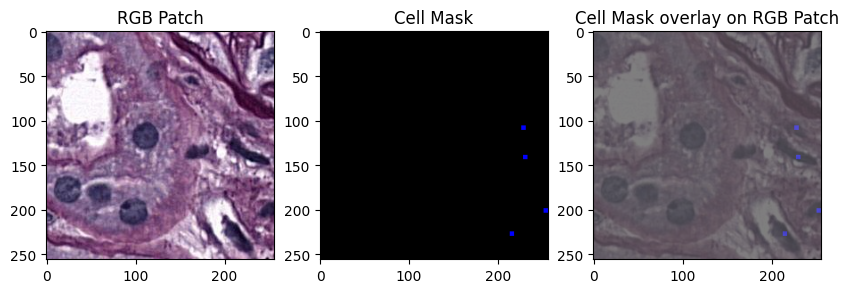

'A_P000029_50848_129920_51104_130176.npy'
{'lymphocytes': [[242, 32],
                 [144, 108],
                 [226, 190],
                 [121, 212],
                 [215, 157],
                 [177, 157],
                 [178, 132],
                 [157, 224]],
 'monocytes': [[40, 30], [64, 49], [3, 35], [79, 221], [164, 195]]}


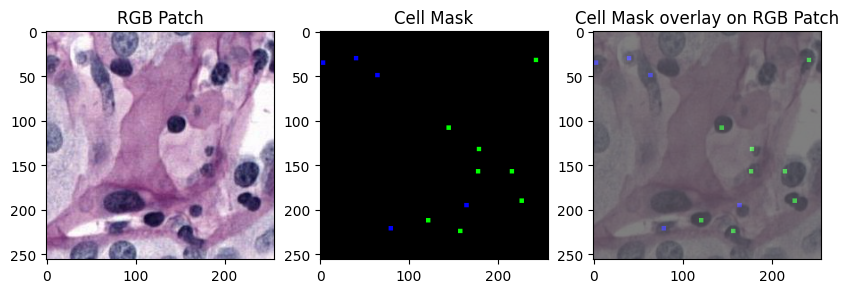

'A_P000029_49280_129024_49536_129280.npy'
{'lymphocytes': [[211, 245]], 'monocytes': []}


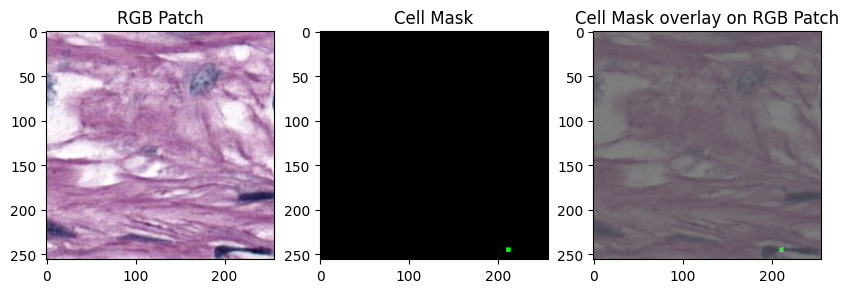

'A_P000014_63616_85344_63872_85600.npy'
{'lymphocytes': [], 'monocytes': []}


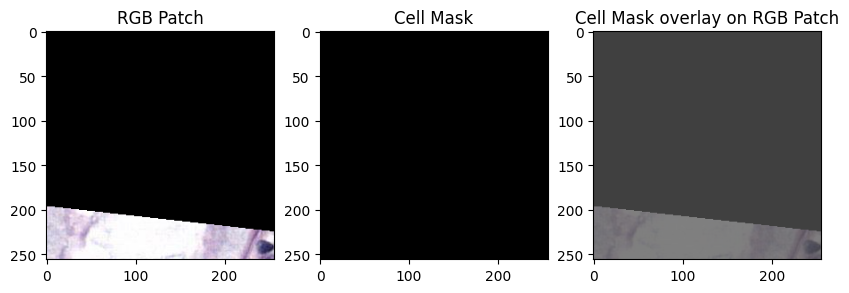

'D_P000011_34496_54880_34752_55136.npy'
{'lymphocytes': [], 'monocytes': []}


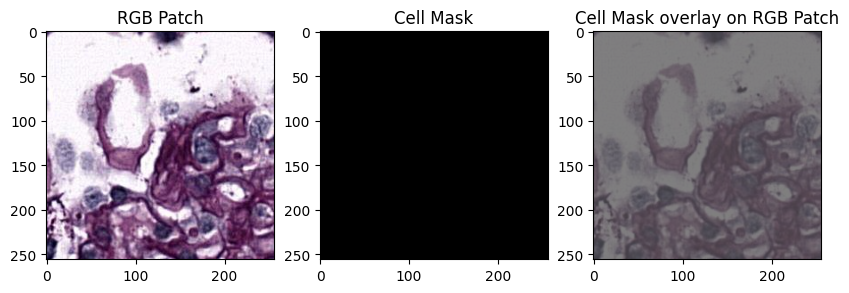

'B_P000019_43456_85568_43712_85824.npy'
{'lymphocytes': [[240, 239],
                 [229, 215],
                 [229, 131],
                 [252, 136],
                 [182, 173],
                 [14, 228],
                 [78, 106],
                 [57, 78],
                 [45, 76],
                 [41, 39]],
 'monocytes': [[229, 198], [64, 239], [35, 207], [137, 88], [179, 96]]}


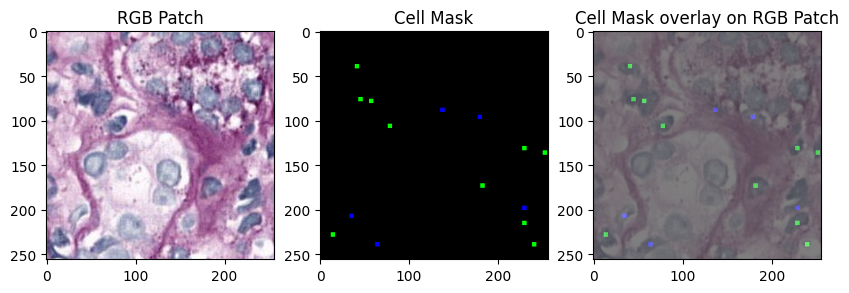

'A_P000020_58240_7616_58496_7872.npy'
{'lymphocytes': [], 'monocytes': []}


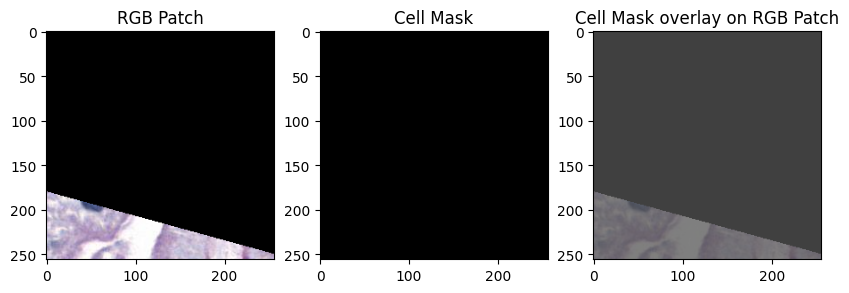

'D_P000014_31136_9856_31392_10112.npy'
{'lymphocytes': [], 'monocytes': []}


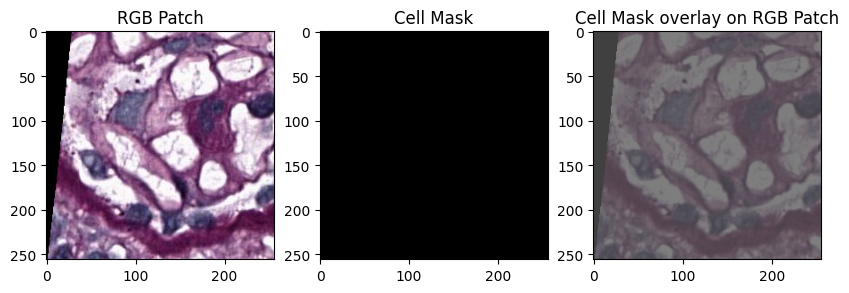

'D_P000015_16128_15008_16384_15264.npy'
{'lymphocytes': [], 'monocytes': []}


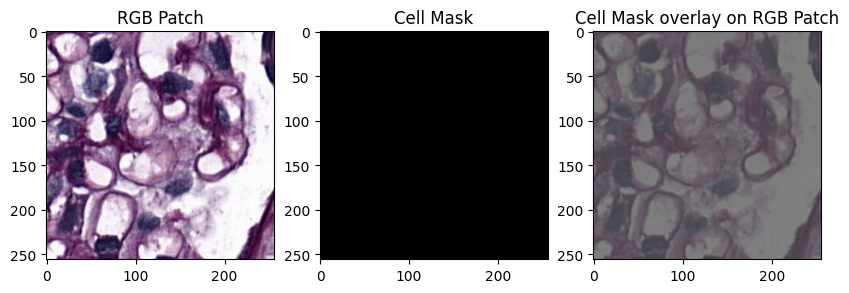

'B_P000015_30688_124992_30944_125248.npy'
{'lymphocytes': [[84, 97], [188, 117]],
 'monocytes': [[59, 135], [211, 98], [174, 175], [205, 195]]}


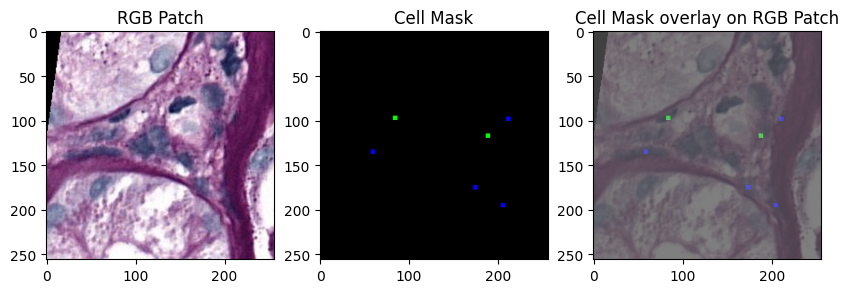

'C_P000026_17696_131264_17952_131520.npy'
{'lymphocytes': [[111, 155], [73, 136]],
 'monocytes': [[94, 63],
               [28, 83],
               [134, 175],
               [136, 224],
               [99, 43],
               [100, 13],
               [52, 69]]}


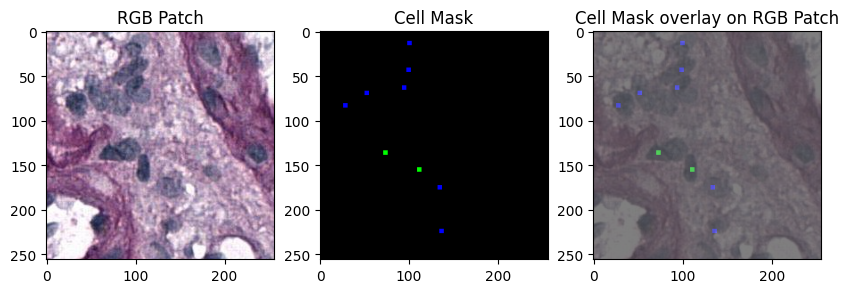

'B_P000003_18592_21504_18848_21760.npy'
{'lymphocytes': [[24, 142], [163, 103]], 'monocytes': [[40, 180], [193, 106]]}


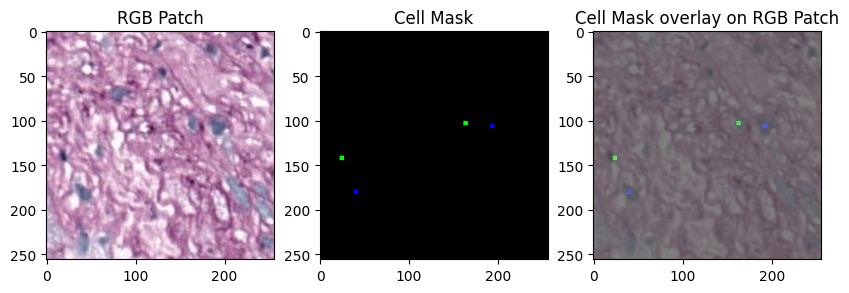

'B_P000005_26656_85344_26912_85600.npy'
{'lymphocytes': [], 'monocytes': []}


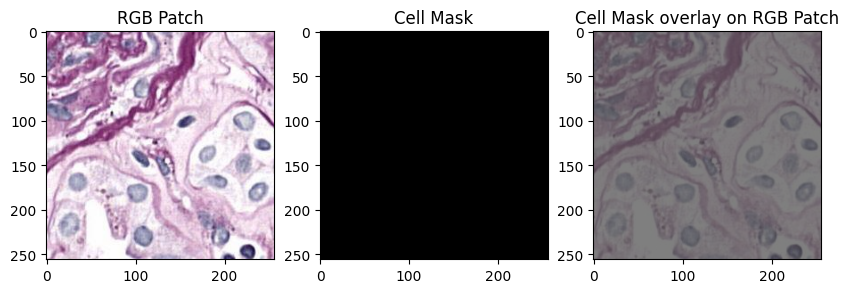

'D_P000018_20160_4704_20416_4960.npy'
{'lymphocytes': [], 'monocytes': []}


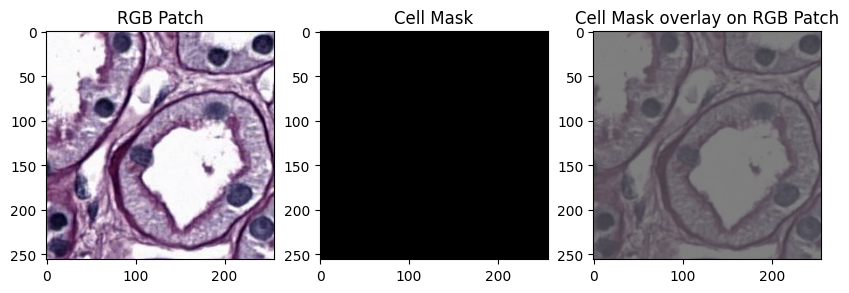

'B_P000007_41888_8960_42144_9216.npy'
{'lymphocytes': [[53, 38]], 'monocytes': []}


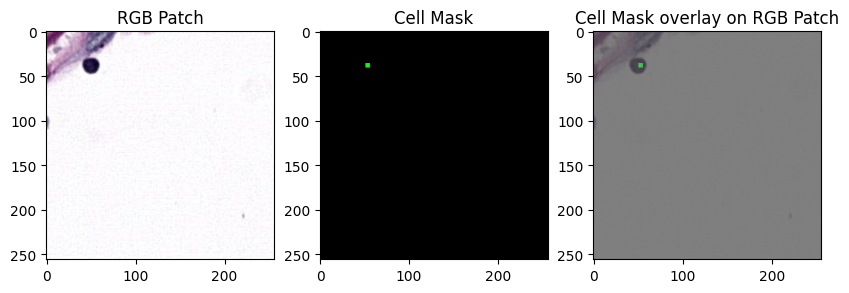

'B_P000013_22176_56000_22432_56256.npy'
{'lymphocytes': [], 'monocytes': []}


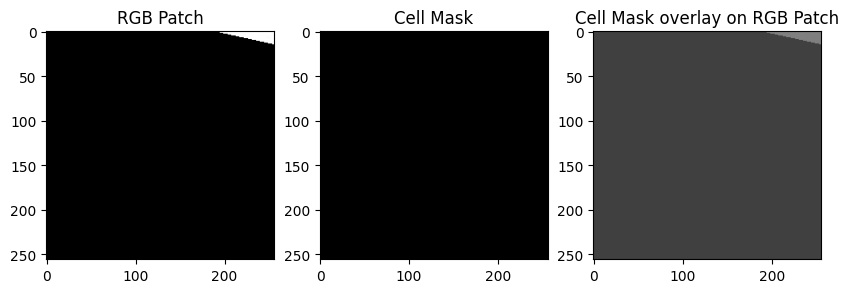

'A_P000020_56224_11200_56480_11456.npy'
{'lymphocytes': [], 'monocytes': []}


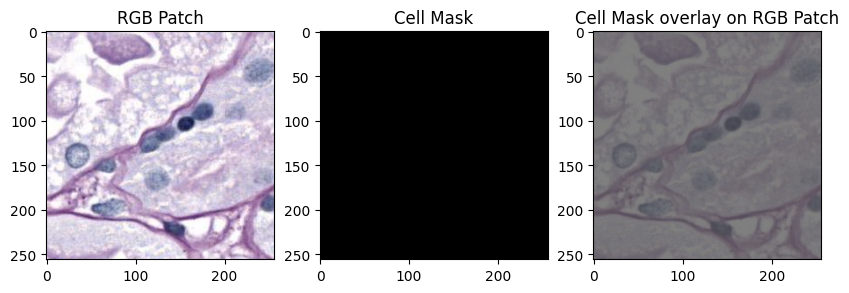

'C_P000037_9408_10304_9664_10560.npy'
{'lymphocytes': [[208, 18],
                 [12, 24],
                 [100, 44],
                 [130, 94],
                 [26, 144],
                 [110, 164],
                 [91, 255],
                 [72, 242],
                 [52, 230],
                 [53, 209],
                 [61, 192],
                 [101, 210],
                 [247, 159],
                 [226, 159],
                 [254, 242],
                 [136, 55],
                 [9, 108],
                 [36, 131],
                 [40, 86],
                 [13, 71],
                 [187, 55],
                 [218, 64],
                 [175, 20],
                 [245, 15]],
 'monocytes': [[65, 99], [68, 66]]}


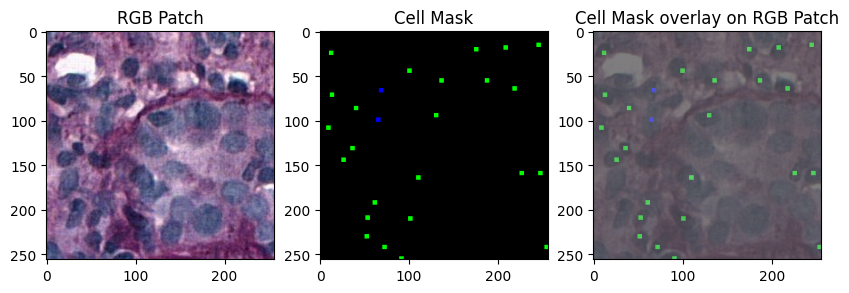

'A_P000004_74592_65856_74848_66112.npy'
{'lymphocytes': [[94, 33],
                 [88, 109],
                 [136, 131],
                 [2, 175],
                 [78, 185],
                 [214, 160],
                 [126, 197],
                 [156, 192],
                 [167, 152],
                 [50, 211],
                 [73, 56],
                 [50, 183],
                 [208, 102],
                 [251, 72]],
 'monocytes': [[79, 146], [21, 146], [158, 20], [156, 41], [28, 183]]}


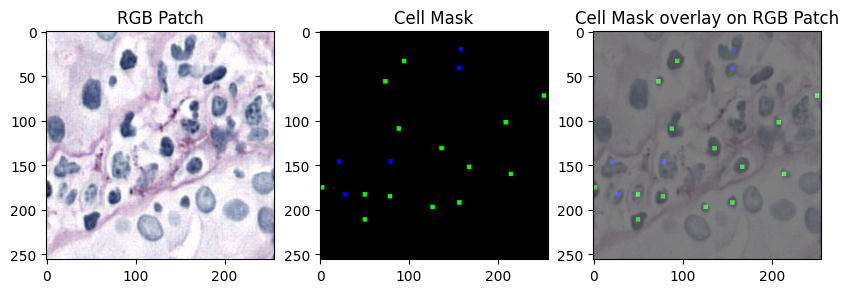

'C_P000035_22176_38528_22432_38784.npy'
{'lymphocytes': [[135, 218]], 'monocytes': [[39, 243]]}


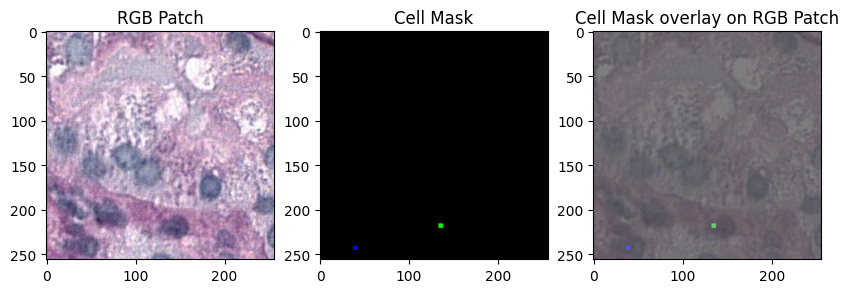

'A_P000029_56000_148512_56256_148768.npy'
{'lymphocytes': [[150, 184], [150, 224], [110, 228], [154, 200]],
 'monocytes': [[48, 206], [224, 57], [52, 63], [21, 169]]}


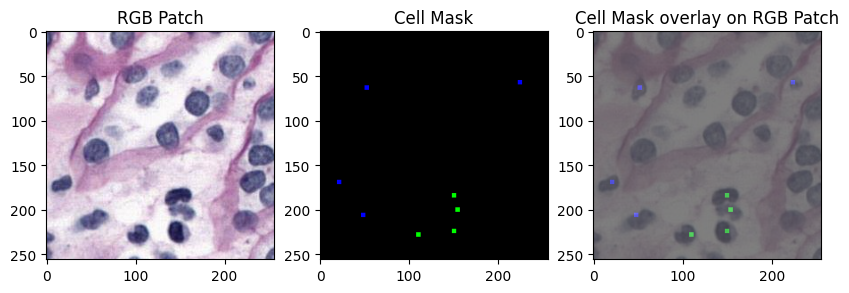

'C_P000027_33600_19488_33856_19744.npy'
{'lymphocytes': [[206, 40],
                 [2, 110],
                 [194, 100],
                 [155, 83],
                 [244, 106],
                 [15, 137],
                 [150, 153],
                 [119, 111],
                 [92, 165],
                 [164, 178]],
 'monocytes': [[220, 68], [82, 90]]}


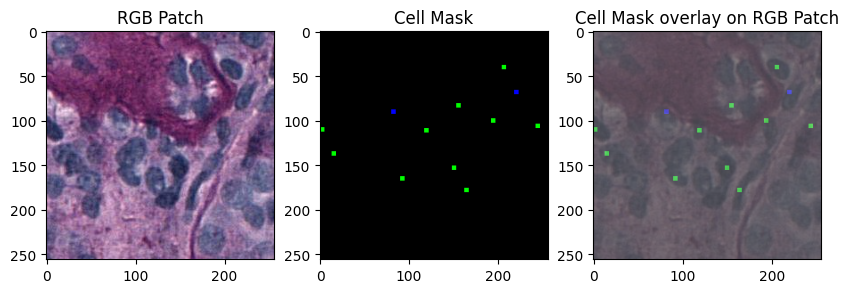

'C_P000037_14112_71904_14368_72160.npy'
{'lymphocytes': [[246, 236],
                 [149, 232],
                 [123, 211],
                 [199, 198],
                 [192, 129],
                 [222, 88],
                 [230, 61],
                 [154, 59],
                 [228, 24],
                 [136, 20]],
 'monocytes': [[249, 131], [245, 156]]}


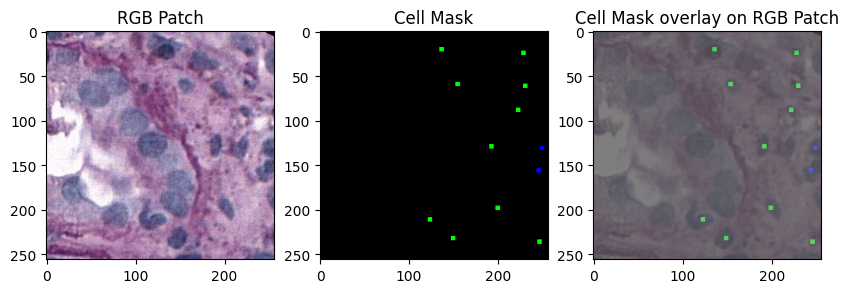

'B_P000007_41888_10528_42144_10784.npy'
{'lymphocytes': [[133, 4],
                 [225, 25],
                 [221, 55],
                 [203, 59],
                 [181, 39],
                 [170, 70],
                 [151, 75],
                 [33, 78],
                 [44, 100],
                 [48, 117],
                 [33, 129],
                 [15, 137],
                 [74, 94],
                 [53, 142],
                 [80, 123],
                 [65, 157],
                 [80, 144],
                 [111, 163],
                 [112, 137],
                 [103, 129],
                 [100, 109],
                 [113, 87],
                 [119, 121],
                 [135, 119],
                 [144, 97],
                 [128, 77],
                 [101, 73],
                 [77, 72],
                 [163, 164],
                 [189, 145],
                 [188, 121],
                 [211, 121],
                 [211, 141],
                 [216, 165],


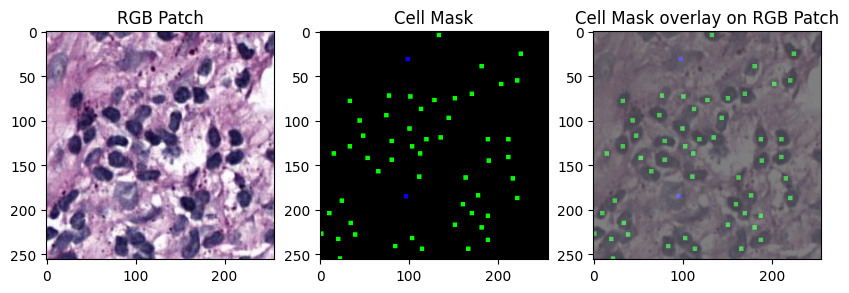

'D_P000015_14784_4928_15040_5184.npy'
{'lymphocytes': [], 'monocytes': []}


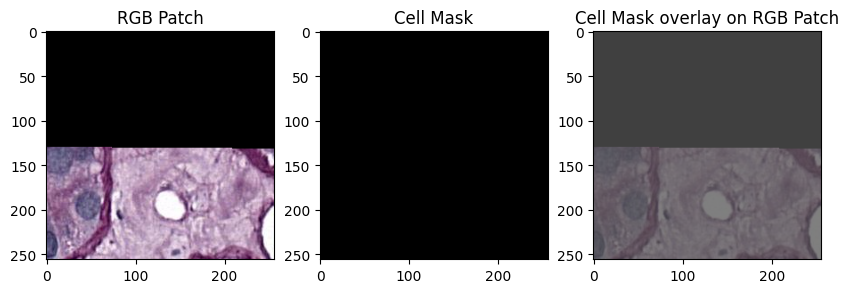

'A_P000029_50400_129024_50656_129280.npy'
{'lymphocytes': [[176, 32],
                 [18, 38],
                 [120, 156],
                 [220, 123],
                 [57, 42],
                 [26, 6],
                 [29, 64],
                 [223, 34]],
 'monocytes': [[32, 15]]}


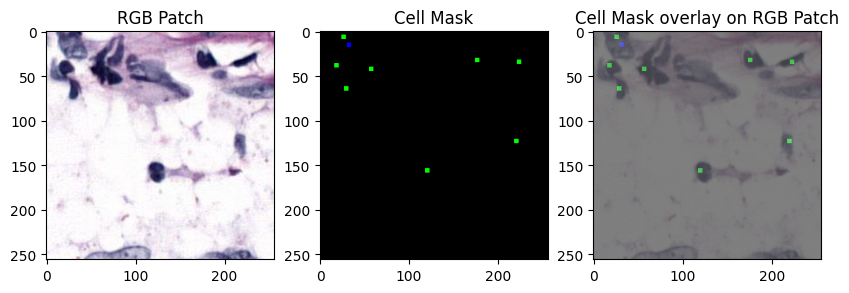

'A_P000021_62272_114688_62528_114944.npy'
{'lymphocytes': [], 'monocytes': [[166, 134], [162, 23], [3, 14]]}


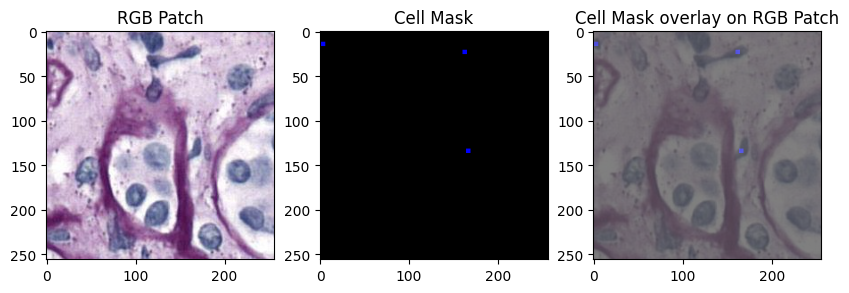

'C_P000034_33376_12992_33632_13248.npy'
{'lymphocytes': [[110, 197], [137, 142], [89, 113], [171, 155]],
 'monocytes': [[32, 56], [218, 63]]}


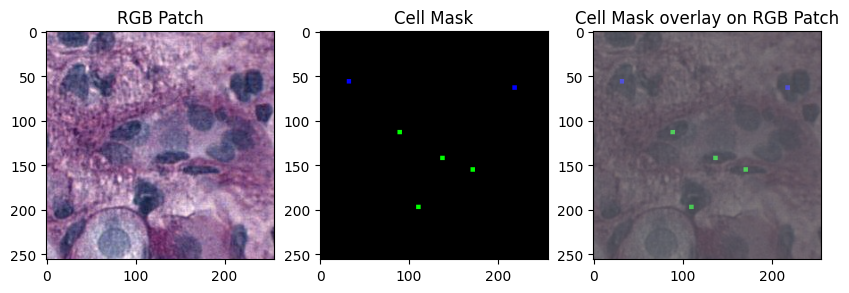

'A_P000036_58912_100800_59168_101056.npy'
{'lymphocytes': [[137, 180]], 'monocytes': []}


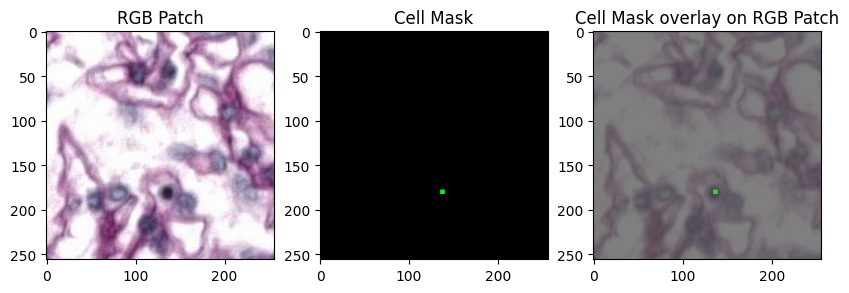

'D_P000002_8512_5376_8768_5632.npy'
{'lymphocytes': [[234, 226], [12, 248]], 'monocytes': [[230, 242], [13, 210]]}


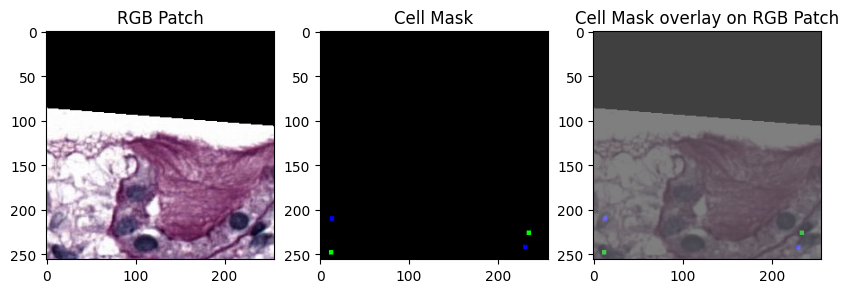

'C_P000024_23968_86688_24224_86944.npy'
{'lymphocytes': [[88, 131],
                 [49, 255],
                 [76, 209],
                 [143, 181],
                 [187, 110],
                 [238, 213],
                 [233, 148],
                 [213, 155],
                 [103, 165],
                 [114, 190],
                 [72, 147],
                 [166, 175],
                 [64, 122],
                 [54, 106],
                 [97, 65],
                 [58, 76]],
 'monocytes': [[13, 114]]}


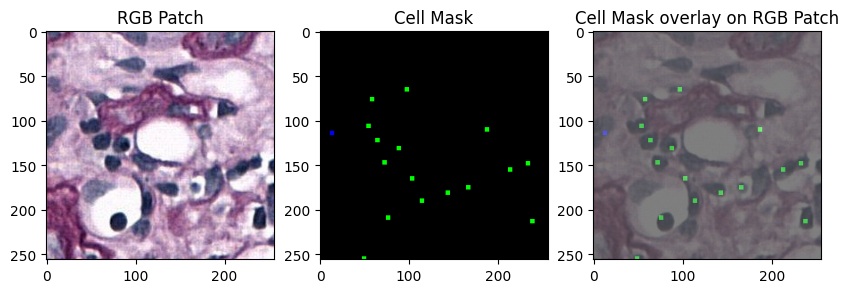

'C_P000026_19488_129696_19744_129952.npy'
{'lymphocytes': [[183, 236], [225, 160], [188, 255], [249, 107]],
 'monocytes': [[10, 199], [207, 14]]}


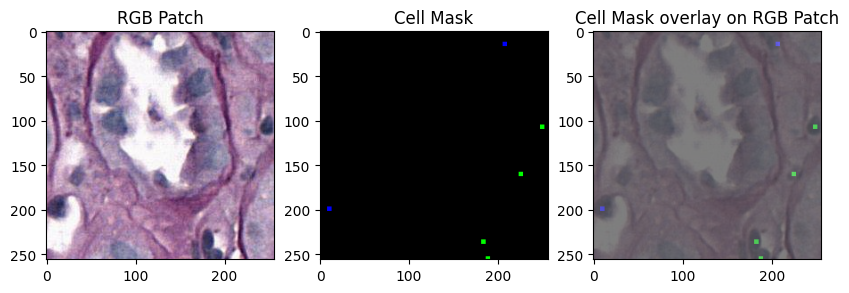

'A_P000037_58688_106624_58944_106880.npy'
{'lymphocytes': [], 'monocytes': []}


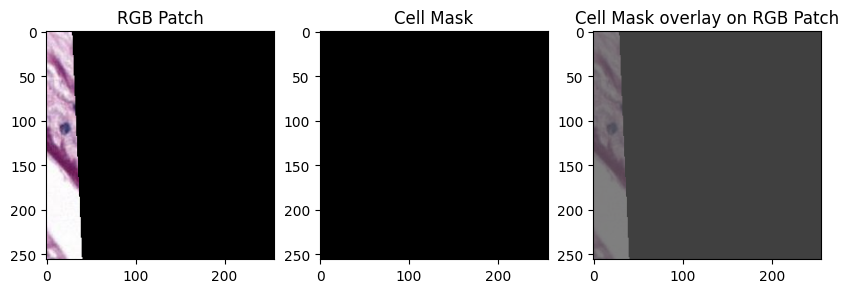

'D_P000005_12320_6720_12576_6976.npy'
{'lymphocytes': [[126, 211]], 'monocytes': []}


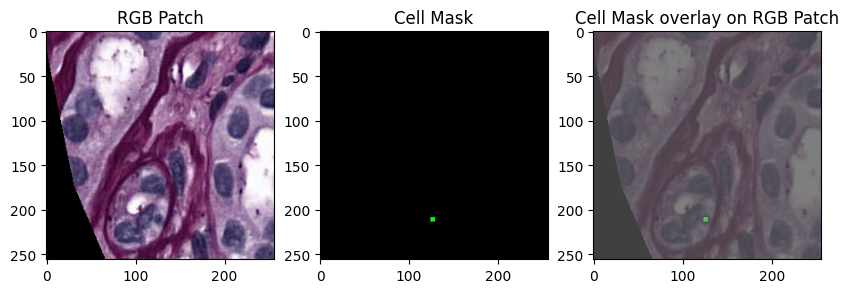

'B_P000009_18592_69440_18848_69696.npy'
{'lymphocytes': [[180, 57],
                 [209, 116],
                 [175, 209],
                 [9, 104],
                 [133, 118],
                 [47, 174],
                 [4, 181],
                 [203, 179]],
 'monocytes': [[1, 228], [24, 162], [96, 117], [132, 43]]}


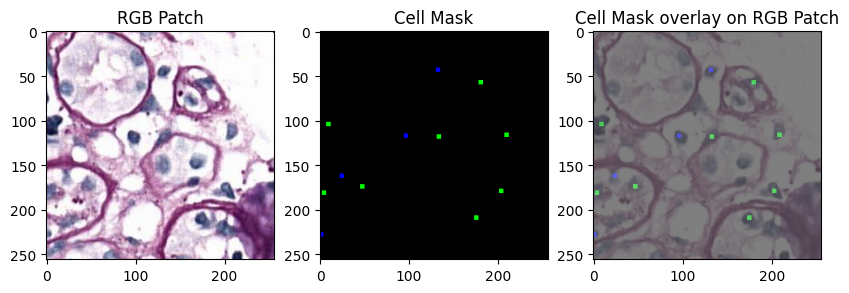

'B_P000005_43232_136192_43488_136448.npy'
{'lymphocytes': [], 'monocytes': []}


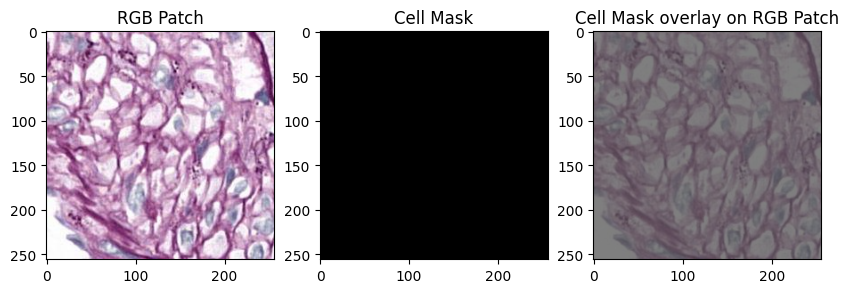

'C_P000033_23520_65408_23776_65664.npy'
{'lymphocytes': [[172, 222], [207, 251], [205, 230], [189, 218]],
 'monocytes': []}


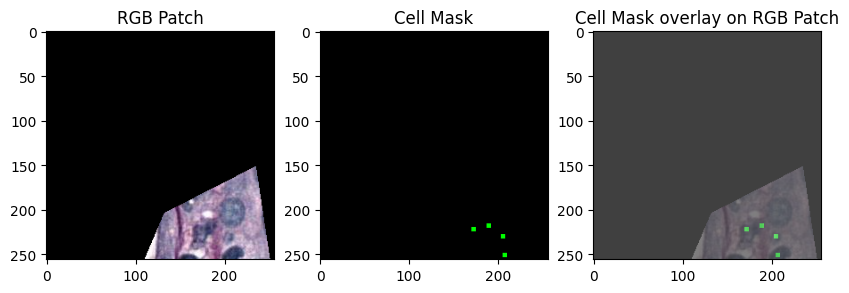

'A_P000004_71904_55552_72160_55808.npy'
{'lymphocytes': [[220, 23],
                 [4, 25],
                 [108, 35],
                 [52, 63],
                 [228, 83],
                 [190, 145],
                 [120, 179],
                 [206, 228],
                 [48, 227],
                 [182, 243],
                 [23, 39],
                 [86, 185],
                 [106, 230],
                 [198, 66],
                 [65, 253]],
 'monocytes': [[151, 228], [57, 185], [73, 225]]}


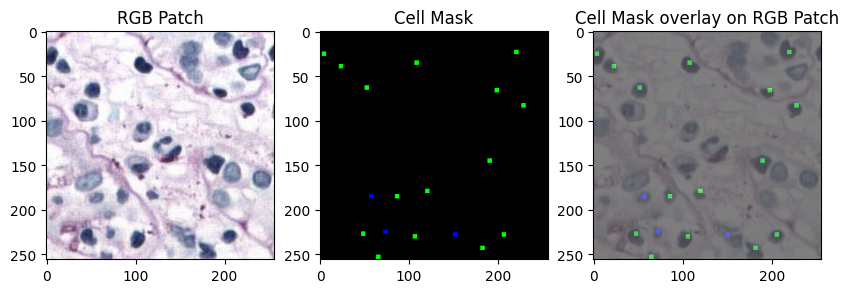

'A_P000038_45696_127008_45952_127264.npy'
{'lymphocytes': [[252, 46],
                 [188, 70],
                 [56, 114],
                 [170, 110],
                 [124, 126],
                 [80, 168],
                 [68, 220],
                 [246, 156]],
 'monocytes': [[234, 232], [59, 152], [223, 167], [181, 196]]}


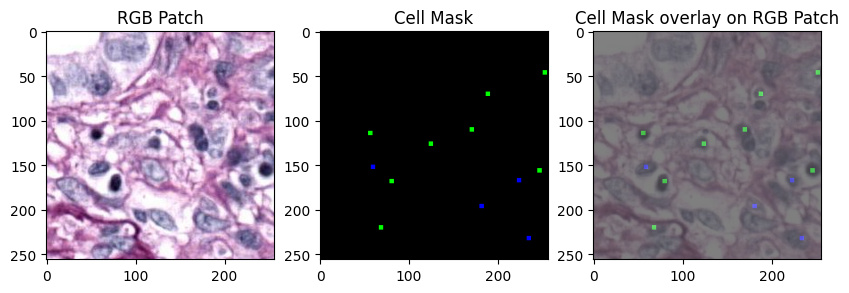

'A_P000029_48608_128800_48864_129056.npy'
{'lymphocytes': [], 'monocytes': []}


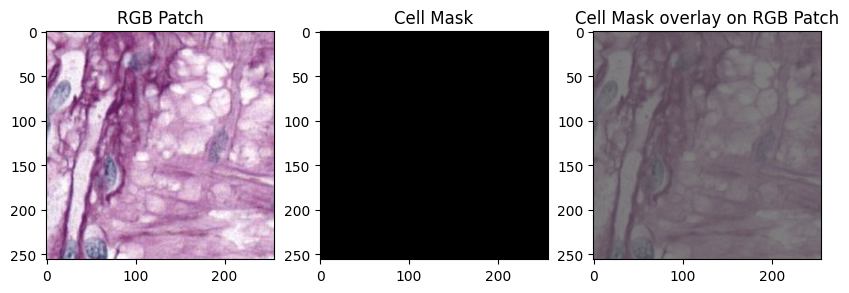

'C_P000034_35168_14112_35424_14368.npy'
{'lymphocytes': [], 'monocytes': []}


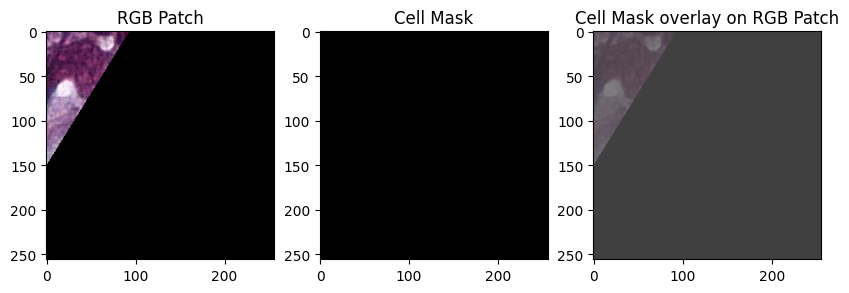

'C_P000023_27552_128352_27808_128608.npy'
{'lymphocytes': [], 'monocytes': []}


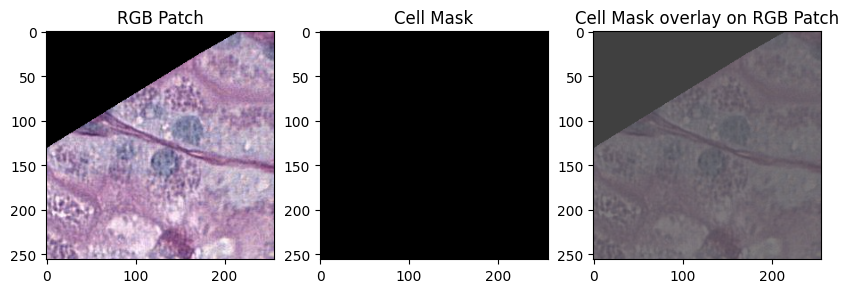

'A_P000036_58016_101472_58272_101728.npy'
{'lymphocytes': [], 'monocytes': []}


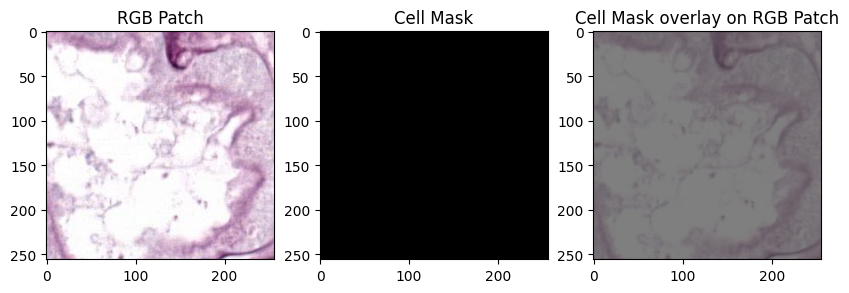

'B_P000015_39200_114912_39456_115168.npy'
{'lymphocytes': [[9, 124], [99, 181], [76, 224]],
 'monocytes': [[60, 88], [21, 165], [64, 247]]}


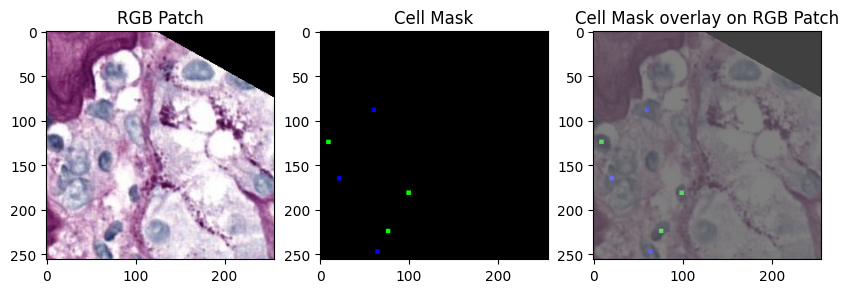

'A_P000033_30912_97440_31168_97696.npy'
{'lymphocytes': [], 'monocytes': []}


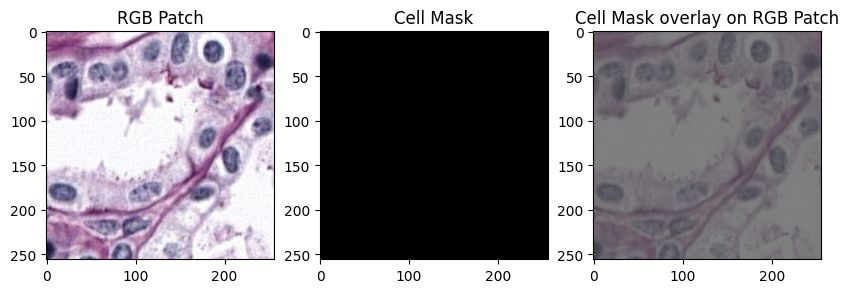

In [16]:
# Specify data folders

# Folder containing image patches
patch_image_dir = "/home/u1910100/Documents/Monkey/patches_256/images"
# Folder containing cell masks
cell_mask_dir = "/home/u1910100/Documents/Monkey/patches_256/annotations/masks"
# Folder containing json files
json_dir = "/home/u1910100/Documents/Monkey/patches_256/annotations/json"


# Visualize 50 random patches
file_names = os.listdir(patch_image_dir)
files_sample = random.sample(file_names, 50)

for name in files_sample:
    name_without_ext = os.path.splitext(name)[0]

    # Get path to files
    patch_image_path = os.path.join(patch_image_dir, f"{name_without_ext}.npy")
    cell_mask_path = os.path.join(cell_mask_dir, f"{name_without_ext}.npy")
    json_path = os.path.join(json_dir, f"{name_without_ext}.json")

    # load RGB patch and cell mask
    image_patch = np.load(patch_image_path)
    cell_mask = np.load(cell_mask_path)
    # Convert cell mask to RGB image for visualization
    rgb_cell_mask = cell_mask_to_rgb(cell_mask)

    # load json file
    annotations = {}
    with open(json_path, "r") as file:
        annotations = json.load(file)

    # Output
    pprint(name)
    pprint(annotations)
    fig, axes = plt.subplots(1, 3, figsize=(10, 10))
    axes[0].imshow(image_patch)
    axes[0].title.set_text("RGB Patch")
    axes[1].imshow(rgb_cell_mask)
    axes[1].title.set_text("Cell Mask")
    axes[2].imshow(image_patch, alpha=0.5)
    axes[2].imshow(rgb_cell_mask, alpha=0.5)
    axes[2].title.set_text("Cell Mask overlay on RGB Patch")
    plt.show()